<a href="https://colab.research.google.com/github/FranciscoMedellin/mna-computer-vision/blob/main/equipo_33_sobel_canny_edge_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Maestría en inteligencia Artificial Aplicada.**##



**TC4033.10 Visión Computacional para imágenes y video**

6.4 Google Colab - Extracción de líneas con algoritmo de Canny



Equipo #33

Jonathan Alberto López Rodríguez - A01794938

Francisco Medellin Zertuche - A01794044

Edgar Rusef Hernández García - A01795076

# 3. Sobel and Canny Edge Detection

## Table of Contents
1. [Libraries](#libraries)
2. [Sobel Edge Detection](#sobel)
3. [Canny Edge Detection](#canny)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import skimage
import numpy as np
from scipy import ndimage
from skimage import exposure
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage.filters import convolve
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med

<ipython-input-1-884896f37a0d>:9: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import convolve
<ipython-input-1-884896f37a0d>:10: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter as gauss
<ipython-input-1-884896f37a0d>:11: DeprecationWarning: Please import `median_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import median_filter as med


## Sobel Edge Detection <a class="anchor" id="sobel" ></a>

As a first step in extracting features, you will apply the Sobel edge detection algorithm. This finds regions of the image with large gradient values in multiple directions. Regions with high omnidirectional gradient are likely to be edges or transitions in the pixel values.

The code in the cell below applies the Sobel algorithm to the median filtered image, using these steps:

1. Convert the color image to grayscale for the gradient calculation since it is two dimensional.
2. Compute the gradient in the x and y (horizontal and vertical) directions.
3. Compute the magnitude of the gradient.
4. Normalize the gradient values.

In [2]:
def edge_sobel(image):
    from scipy import ndimage
    import skimage.color as sc
    import numpy as np
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

In [ ]:
original_image = np.load('data/img.npy')

img = skimage.util.random_noise(original_image)
plt.imshow(img)

FileNotFoundError: [Errno 2] No such file or directory: 'data/img.npy'

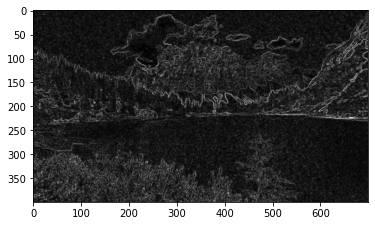

In [ ]:
img_med = med(img, size=2)
img_edge = edge_sobel(img_med)
plt.imshow(img_edge, cmap="gray")

Now let's try with the more blurred gaussian filtered image.

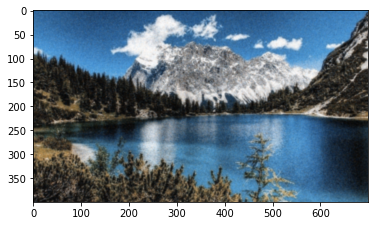

In [ ]:
img_gauss = gauss(img, sigma=1)
plt.imshow(img_gauss)

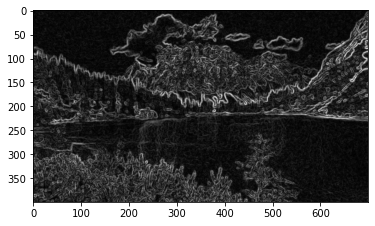

In [ ]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")

## Canny Edge Detection <a class="anchor" id="canny" ></a>

Steps:
1. Noise Reduction
2. Gradient Calculation
3. Non-maximum Supression
4. Double Threshold
5. Edge Tracking by Hysteresis

**Pre-requisite:** Convert the image to grayscale before algorithm.

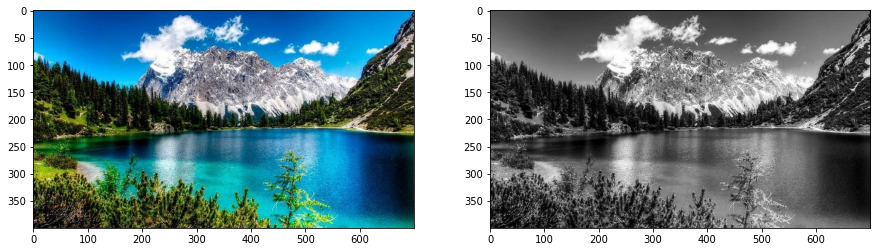

In [ ]:
img = cv2.imread('data/image.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### 1. Noise Reduction
Edge detection are highly sensitive to image noise due to the derivatives behind the algorithm.

We can apply a Gaussian Kernel, the size of the kernel depends on the expected blurring effect. The smaller the less blurring effect.

Equation for Gaussian Kernel of size $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [3]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

### 1.1 Sigma Parameter $\sigma$

In [8]:
# Change this parameter
sigma = 10 # 1, 3, 5, 10, 20, ...

### 1.2 Kernel Size Parameter

In [9]:
kernel_size = 3

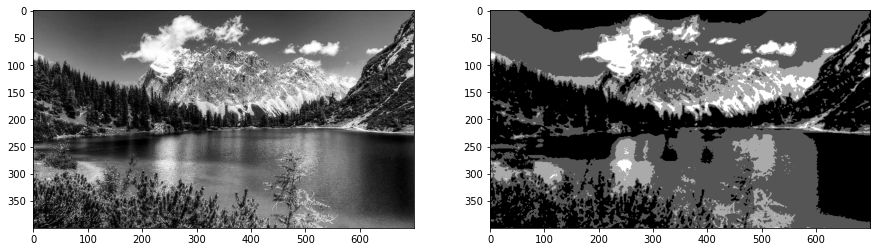

In [ ]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

### 2. Gradient Calculation

Edges correspond to a change of pixels intensity.

To detect it, the easiest way is to apply filters that highlight this intensity change in both directions:
- horizontal $(x)$
- and vertical $(y)$

It can be implemented by convoling $I$ with *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

In [4]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)

    return (G, theta)

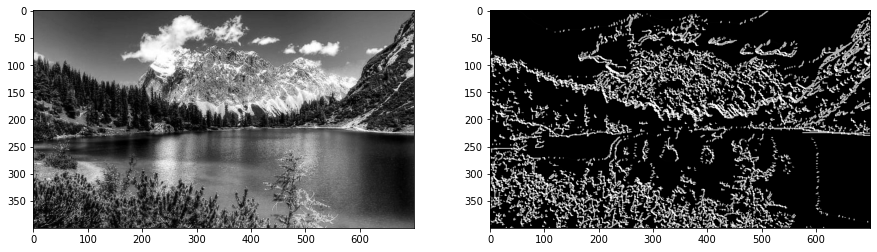

In [ ]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(G, cmap="gray")

### 3. Non-Maximum supression

1. Create a matrix initialized to 0 of the same size of the original gradient intensity matrix
2. Identify the edge direction based on the angle value from the angle matrix
3. Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed
4. Return the image processed with the non-max suppression algorithm.

In [5]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180


    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255

               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass

    return Z

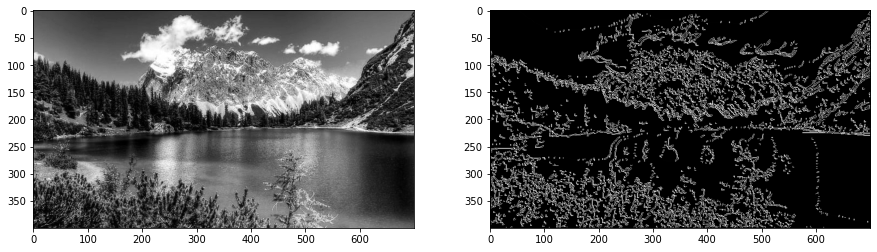

In [ ]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")

### 4. Double threshold

- Strong pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
- Weak pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
- Other pixels are considered as non-relevant for the edge.

In [6]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):

    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;

    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)

    weak = np.int32(25)
    strong = np.int32(255)

    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)

    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return (res)

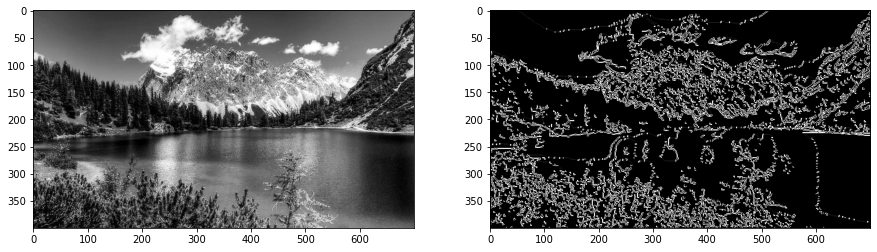

In [ ]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")

### 5. Edge Tracking by Hysteresis

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [7]:
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

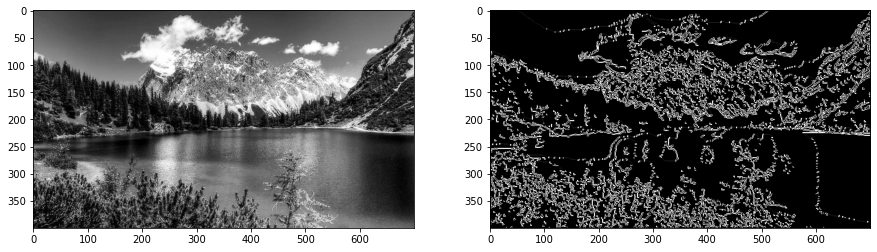

In [ ]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")

# 6.4 Google Colab - Extracción de líneas con algoritmo de Canny <a class="anchor" id="Actividad.6.4" ></a>

El algoritmo de Canny, como muchos otros métodos de extracción de líneas a partir de imágenes, es un bloque esencial para muchos algoritmos de procesamiento de imágenes de más alto nivel, así como en algoritmos de detección de objetos (por ejemplo, rostros o peatones usando el Histogram of Gradients o HoG) y extracción de puntos de interés (método de Harris o el Scale Invariant Feature Transform ó SIFT). Asimismo varios de los parámetros de diseño del método de Canny son muy importantes para entender otros algoritmos de visión computacional, lo que hace que su comprensión sea de suma importancia.

En esta actividad implementaremos el método de extracción de líneas de Canny usando OpenCV y Python desde los aspectos de bajo nivel, modificando los parámetros más importantes para comprender su impacto en el desempeño del algoritmo.

## a) modifica el valor de sigma y observa los cambios en las lineas detectas

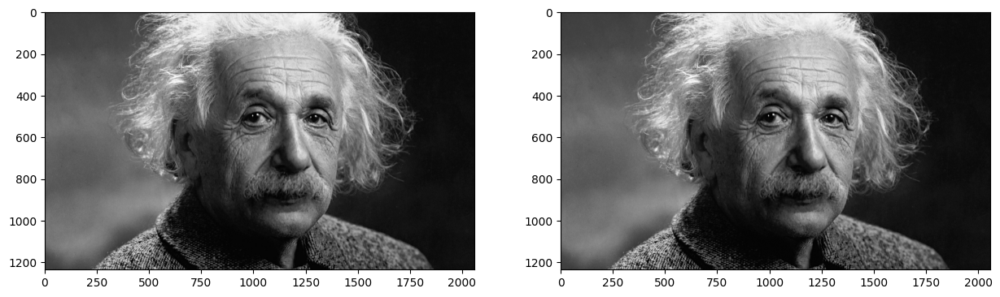

In [ ]:
img = cv2.imread('einstein.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

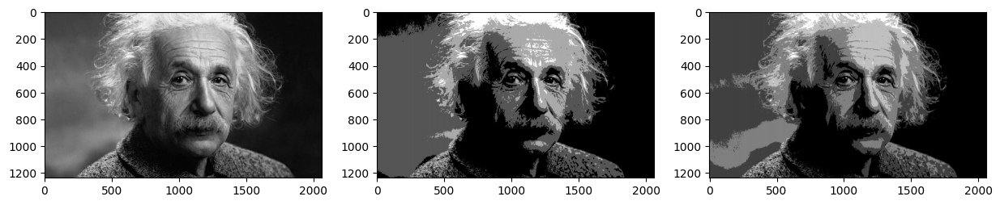

In [ ]:
sigma = 10

img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

sigma = 9

img_gaussian_sigma_20 = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 3, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 3, 2)
plt.imshow(img_gaussian, cmap="gray")
plt.subplot(1, 3, 3)
plt.imshow(img_gaussian_sigma_20, cmap="gray")


### Variaciones del parametro sigma

En este caso en específico, el parámetro sigma aumenta o disminuye el desenfoque producido en la imagen en función del crecimiento o disminución de este.
Este tiene una afección importante en el reconocimiento de lineas y bordes en la imagen. El rango más efectivo parece estar entre 8 y 10.

<ipython-input-4-58755cae58d6>:5: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Ix = ndimage.filters.convolve(img, Kx)
<ipython-input-4-58755cae58d6>:6: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Iy = ndimage.filters.convolve(img, Ky)


Text(0.5, 1.0, 'Imagen Final con Sigma 8')

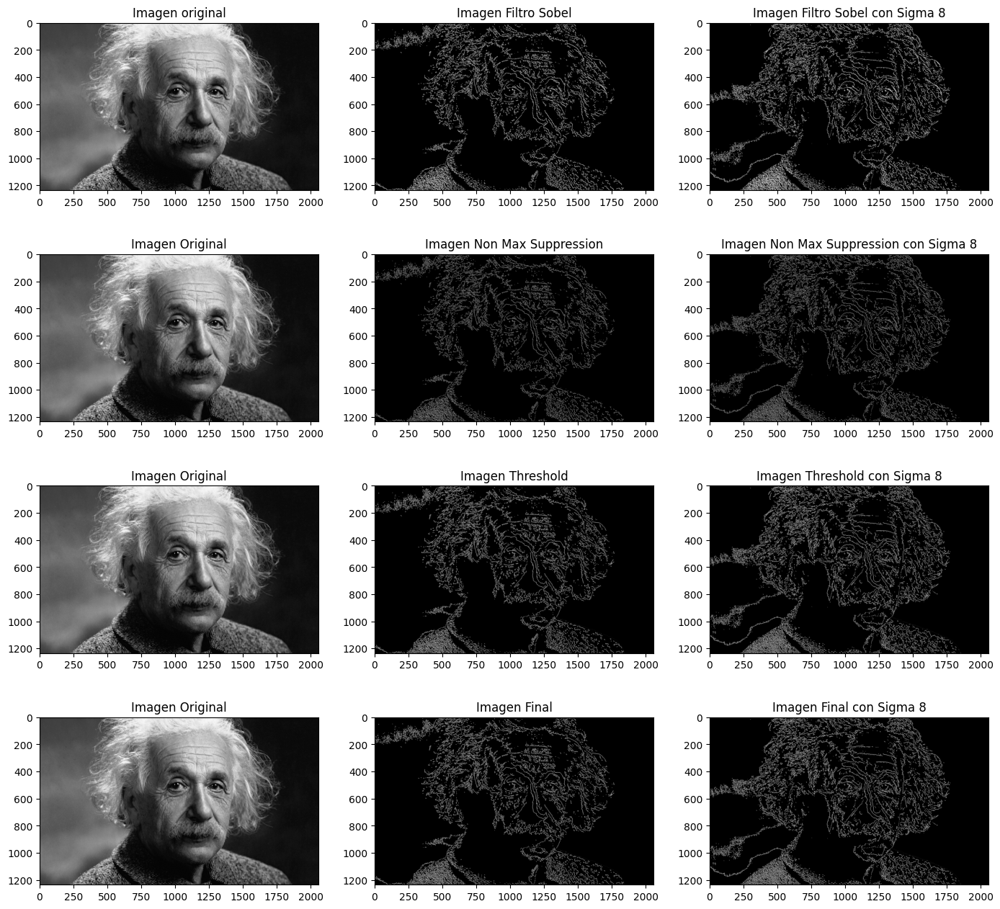

In [ ]:
G, theta = sobel_filters(img_gaussian)
G8, theta8 = sobel_filters(img_gaussian_sigma_20)

img_nonmax = non_max_suppression(G, theta)

img_nonmax8 = non_max_suppression(G8, theta8)

img_threshold = threshold(img_nonmax)

img_threshold8 = threshold(img_nonmax8)

img_final = hysteresis(img_threshold)

img_final8 = hysteresis(img_threshold8)


plt.figure(figsize=(17, 16))
plt.subplot(4, 3, 1)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen original")

plt.subplot(4, 3, 2)
plt.imshow(G, cmap="gray")
plt.title("Imagen Filtro Sobel")

plt.subplot(4, 3, 3)
plt.imshow(G8, cmap="gray")
plt.title("Imagen Filtro Sobel con Sigma 8")

plt.subplot(4,3,4)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen Original")

plt.subplot(4,3,5)
plt.imshow(img_nonmax, cmap="gray")
plt.title("Imagen Non Max Suppression")

plt.subplot(4,3,6)
plt.imshow(img_nonmax8, cmap="gray")
plt.title("Imagen Non Max Suppression con Sigma 8")

plt.subplot(4,3,7)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen Original")

plt.subplot(4,3,8)
plt.imshow(img_threshold, cmap="gray")
plt.title("Imagen Threshold")

plt.subplot(4,3,9)
plt.imshow(img_threshold8, cmap="gray")
plt.title("Imagen Threshold con Sigma 8")

plt.subplot(4,3,10)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen Original")

plt.subplot(4,3,11)
plt.imshow(img_final, cmap="gray")
plt.title("Imagen Final")

plt.subplot(4,3,12)
plt.imshow(img_final8, cmap="gray")
plt.title("Imagen Final con Sigma 8")




## b) Analiza el comportamiento del Canny Detector con y sin remoción de ruido

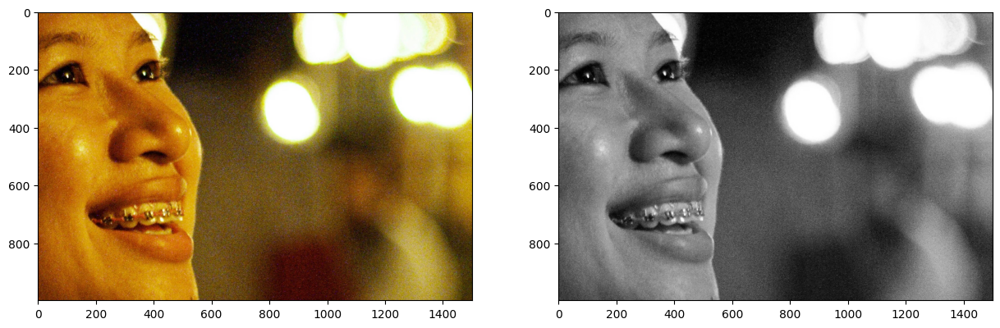

In [ ]:

img_conv = cv2.imread('ruido.jpg')

img_color = cv2.cvtColor(img_conv, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_conv, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### Pruebas sin desenfoque Gaussiano

Después de hacer estas pruebas podemos ver la importancia inicial que tiene el desenfoque Gaussiano puesto que para el final del proceso, los bordes en la imagen que no paso por el filtro gaussiano, solo son visibles en los cambios muy agresivos de los gradientes de los pixeles (en este caso en las luces de fondo).

<ipython-input-4-58755cae58d6>:5: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Ix = ndimage.filters.convolve(img, Kx)
<ipython-input-4-58755cae58d6>:6: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Iy = ndimage.filters.convolve(img, Ky)


Text(0.5, 1.0, 'Imagen Final con Gaussian Blurr')

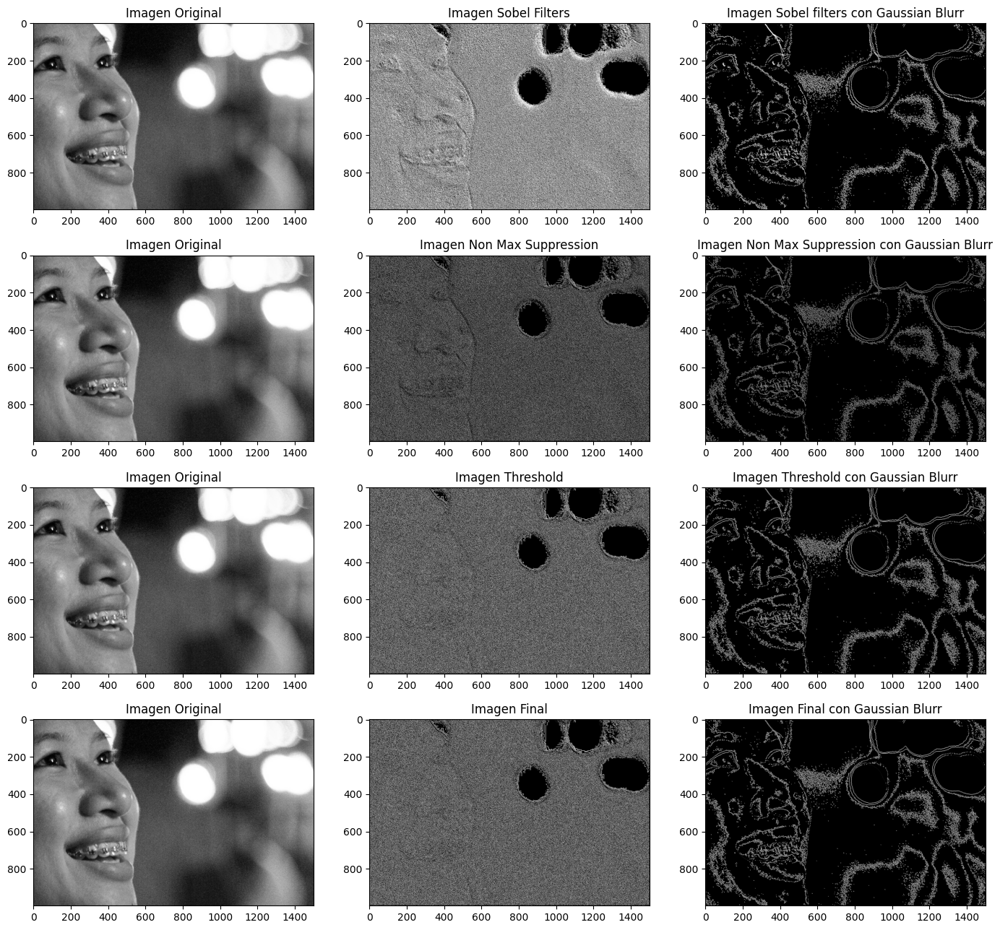

In [ ]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

Gg, thetag = sobel_filters(img_gaussian)

G, theta = sobel_filters(img_gray)

img_nonmax = non_max_suppression(G, theta)

img_nonmaxg = non_max_suppression(Gg, thetag)

img_threshold = threshold(img_nonmax)

img_thresholdg = threshold(img_nonmaxg)

img_final = hysteresis(img_threshold)

img_finalg = hysteresis(img_thresholdg)


plt.figure(figsize=(17, 16))

plt.subplot(4,3,1)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen Original")

plt.subplot(4,3,2)
plt.imshow(G, cmap="gray")
plt.title("Imagen Sobel Filters")

plt.subplot(4,3,3)
plt.imshow(Gg, cmap="gray")
plt.title("Imagen Sobel filters con Gaussian Blurr")

plt.subplot(4,3,4)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen Original")

plt.subplot(4,3,5)
plt.imshow(img_nonmax, cmap="gray")
plt.title("Imagen Non Max Suppression")

plt.subplot(4,3,6)
plt.imshow(img_nonmaxg, cmap="gray")
plt.title("Imagen Non Max Suppression con Gaussian Blurr")

plt.subplot(4,3,7)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen Original")

plt.subplot(4,3,8)
plt.imshow(img_threshold, cmap="gray")
plt.title("Imagen Threshold")

plt.subplot(4,3,9)
plt.imshow(img_thresholdg, cmap="gray")
plt.title("Imagen Threshold con Gaussian Blurr")

plt.subplot(4,3,10)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen Original")

plt.subplot(4,3,11)
plt.imshow(img_final, cmap="gray")
plt.title("Imagen Final")

plt.subplot(4,3,12)
plt.imshow(img_finalg, cmap="gray")
plt.title("Imagen Final con Gaussian Blurr")

## c) Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo

In [10]:
import urllib.request

def get_web_image(url):
  """
  Return img based on url, example: "https://raw.githubusercontent.com/FranciscoMedellin/mna-computer-vision/refs/heads/main/print-after-segmentation.png"
  """
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype="uint8")
  img = cv2.imdecode(image, cv2.IMREAD_COLOR)
  return img
# img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
# print(plt.imshow(img,cmap="gray"))
# plt.show()

In [11]:
img_path = 'https://raw.githubusercontent.com/FranciscoMedellin/mna-computer-vision/refs/heads/main/images/' #image1.png
images = ['image1.png', 'image2.png', 'image3.png', 'image4.png', 'image5.png', 'image6.png']

In [25]:
def show_img_original_gay(img):
  img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  plt.figure(figsize=(15, 8))
  plt.subplot(1, 2, 1)
  plt.imshow(img_color)
  plt.subplot(1, 2, 2)
  plt.imshow(img_gray, cmap="gray")

In [26]:
def compare_sigma(img_gray, sigma1, sigma2):
  img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma1)) # sigma1 = 10
  img_gaussian_sigma_2 = convolve(img_gray, gaussian_kernel(kernel_size, sigma2)) # sigma2 = 9 - 20
  plt.figure(figsize=(15, 8))
  plt.subplot(1, 3, 1)
  plt.imshow(img_gray, cmap="gray")
  plt.subplot(1, 3, 2)
  plt.imshow(img_gaussian, cmap="gray")
  plt.subplot(1, 3, 3)
  plt.imshow(img_gaussian_sigma_2, cmap="gray")

  return img_gaussian, img_gaussian_sigma_2

In [27]:
def set_canny(img_gray, img_gaussian, img_gaussian_sigma_2):
  G, theta = sobel_filters(img_gaussian)
  G2, theta2 = sobel_filters(img_gaussian_sigma_2)
  img_nonmax = non_max_suppression(G, theta)
  img_nonmax2 = non_max_suppression(G2, theta2)
  img_threshold = threshold(img_nonmax)
  img_threshold2 = threshold(img_nonmax2)
  img_final = hysteresis(img_threshold)
  img_final2 = hysteresis(img_threshold2)

  # Plot images
  plt.figure(figsize=(17, 16))
  plt.subplot(4, 3, 1)
  plt.imshow(img_gray, cmap="gray")
  plt.title("Imagen original")

  plt.subplot(4, 3, 2)
  plt.imshow(G, cmap="gray")
  plt.title("Imagen Filtro Sobel")

  plt.subplot(4, 3, 3)
  plt.imshow(G2, cmap="gray")
  plt.title("Imagen Filtro Sobel con Sigma2")

  plt.subplot(4,3,4)
  plt.imshow(img_gray, cmap="gray")
  plt.title("Imagen Original")

  plt.subplot(4,3,5)
  plt.imshow(img_nonmax, cmap="gray")
  plt.title("Imagen Non Max Suppression")

  plt.subplot(4,3,6)
  plt.imshow(img_nonmax2, cmap="gray")
  plt.title("Imagen Non Max Suppression con Sigma2")

  plt.subplot(4,3,7)
  plt.imshow(img_gray, cmap="gray")
  plt.title("Imagen Original")

  plt.subplot(4,3,8)
  plt.imshow(img_threshold, cmap="gray")
  plt.title("Imagen Threshold")

  plt.subplot(4,3,9)
  plt.imshow(img_threshold2, cmap="gray")
  plt.title("Imagen Threshold con Sigma2")

  plt.subplot(4,3,10)
  plt.imshow(img_gray, cmap="gray")
  plt.title("Imagen Original")

  plt.subplot(4,3,11)
  plt.imshow(img_final, cmap="gray")
  plt.title("Imagen Final")

  plt.subplot(4,3,12)
  plt.imshow(img_final2, cmap="gray")
  plt.title("Imagen Final con Sigma2")


### Imagen 1 - Planta

In [20]:
img1 = get_web_image(img_path + images[0])
img_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
show_img_original_gay(img1)

Modificar valor de sigma para encontrar 2 valores y su resultado

In [28]:
sigma1 = 10
sigma2 = 9

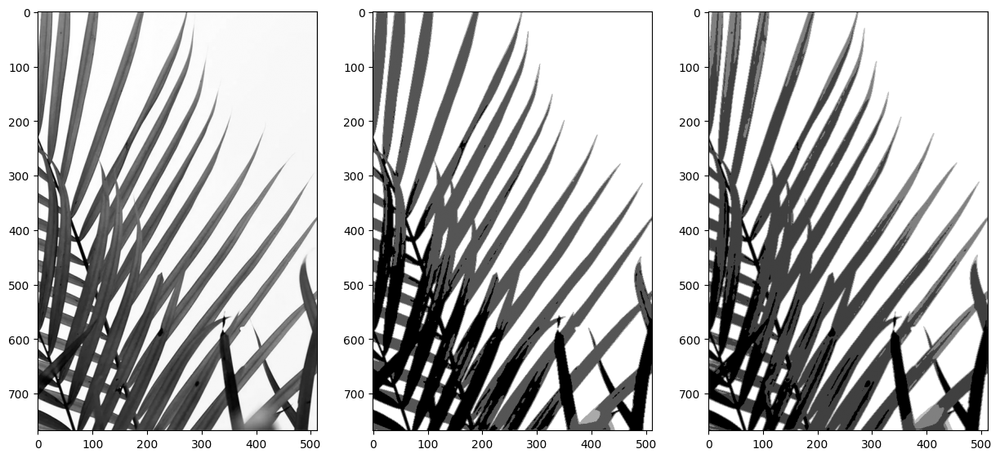

In [29]:
img_gaussian, img_gaussian_sigma_2 = compare_sigma(img_gray, sigma1, sigma2)

Una vez modificado el parámetro sigma para encontrar el rango mas efectivo, aplicamos canny. Para este caso el rango efectivo paraece estar entre 9 y 10.

<ipython-input-4-dddc2aedcd55>:5: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Ix = ndimage.filters.convolve(img, Kx)
<ipython-input-4-dddc2aedcd55>:6: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Iy = ndimage.filters.convolve(img, Ky)


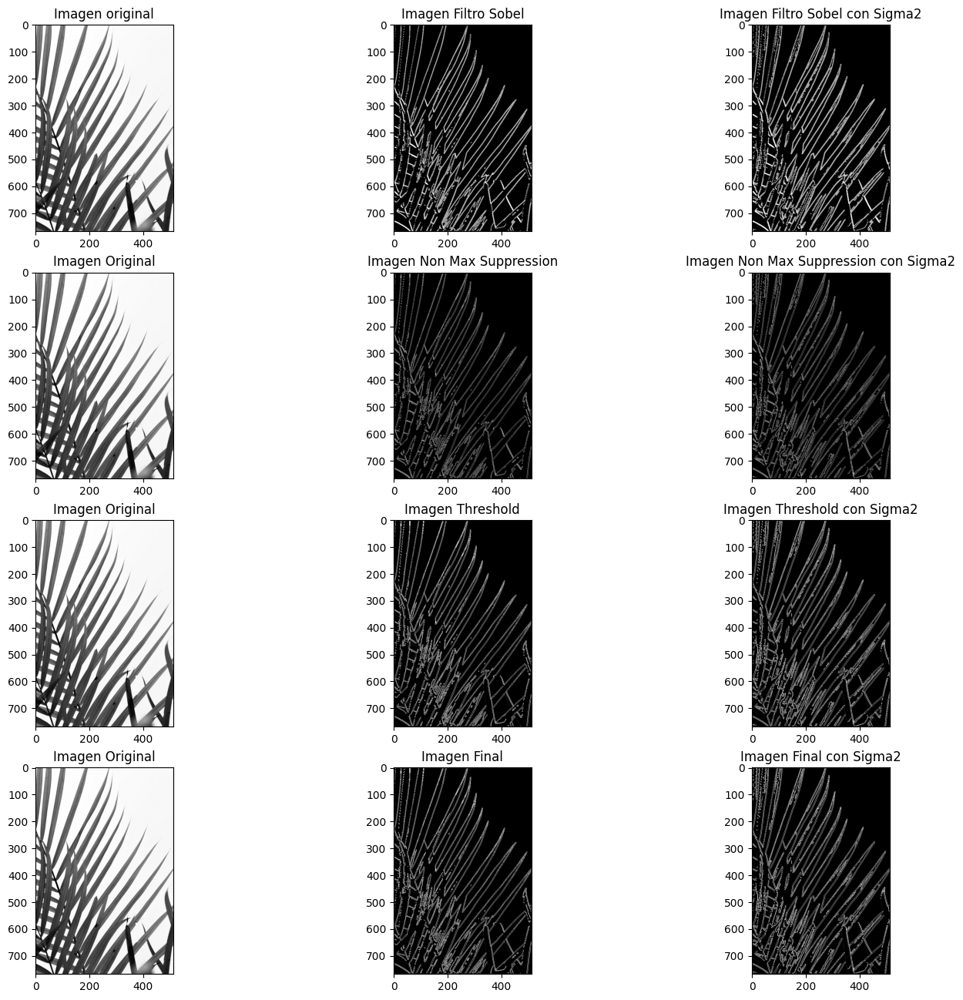

In [30]:
set_canny(img_gray, img_gaussian, img_gaussian_sigma_2)

### Imagen 2 - Venecia

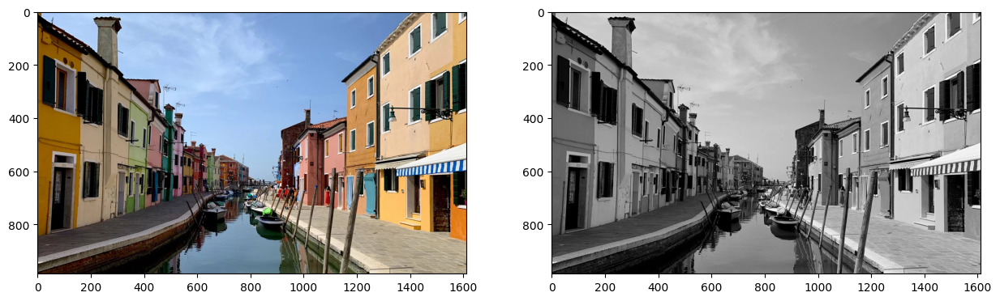

In [31]:
img1 = get_web_image(img_path + images[1])
img_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
show_img_original_gay(img1)

Modificar valor de sigma para encontrar 2 valores y su resultado

In [42]:
sigma1 = 7
sigma2 = 8

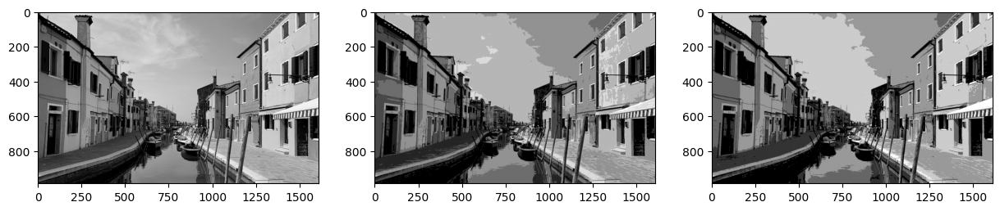

In [43]:
img_gaussian, img_gaussian_sigma_2 = compare_sigma(img_gray, sigma1, sigma2)

Una vez modificado el parámetro sigma para encontrar el rango mas efectivo, aplicamos canny. Para este caso el rango efectivo paraece estar entre 7 y 8.

<ipython-input-4-dddc2aedcd55>:5: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Ix = ndimage.filters.convolve(img, Kx)
<ipython-input-4-dddc2aedcd55>:6: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Iy = ndimage.filters.convolve(img, Ky)


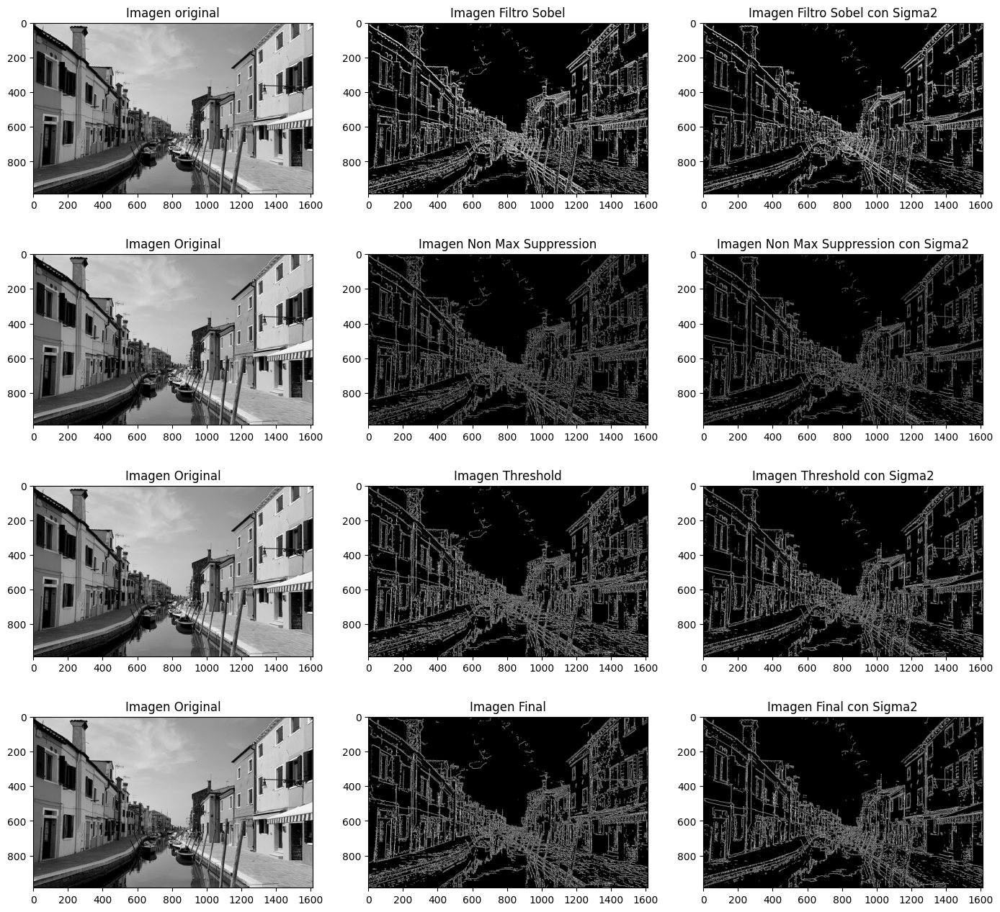

In [44]:
set_canny(img_gray, img_gaussian, img_gaussian_sigma_2)

### Imagen 3 - Tigre

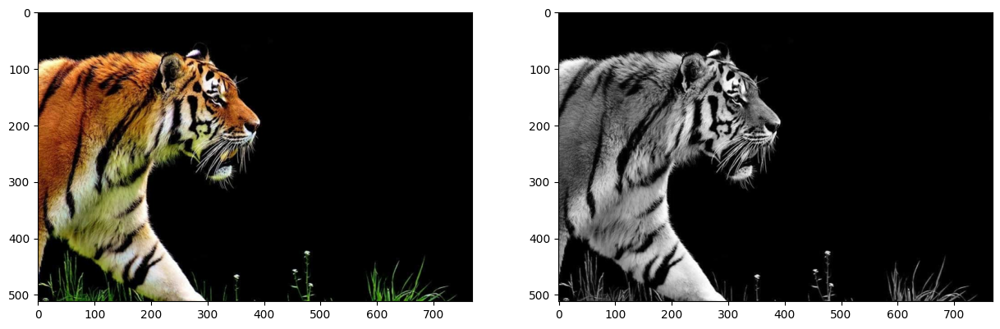

In [50]:
img1 = get_web_image(img_path + images[4])
img_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
show_img_original_gay(img1)

Modificar valor de sigma para encontrar 2 valores y su resultado

In [59]:
sigma1 = 10
sigma2 = 11

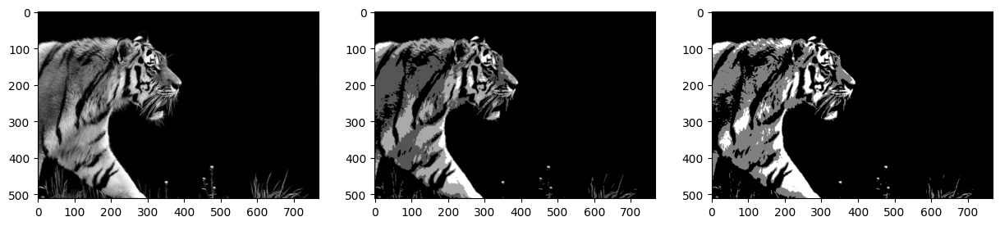

In [60]:
img_gaussian, img_gaussian_sigma_2 = compare_sigma(img_gray, sigma1, sigma2)

Una vez modificado el parámetro sigma para encontrar el rango mas efectivo, aplicamos canny. Para este caso el rango efectivo paraece estar entre 10 y 11.

<ipython-input-4-dddc2aedcd55>:5: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Ix = ndimage.filters.convolve(img, Kx)
<ipython-input-4-dddc2aedcd55>:6: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  Iy = ndimage.filters.convolve(img, Ky)


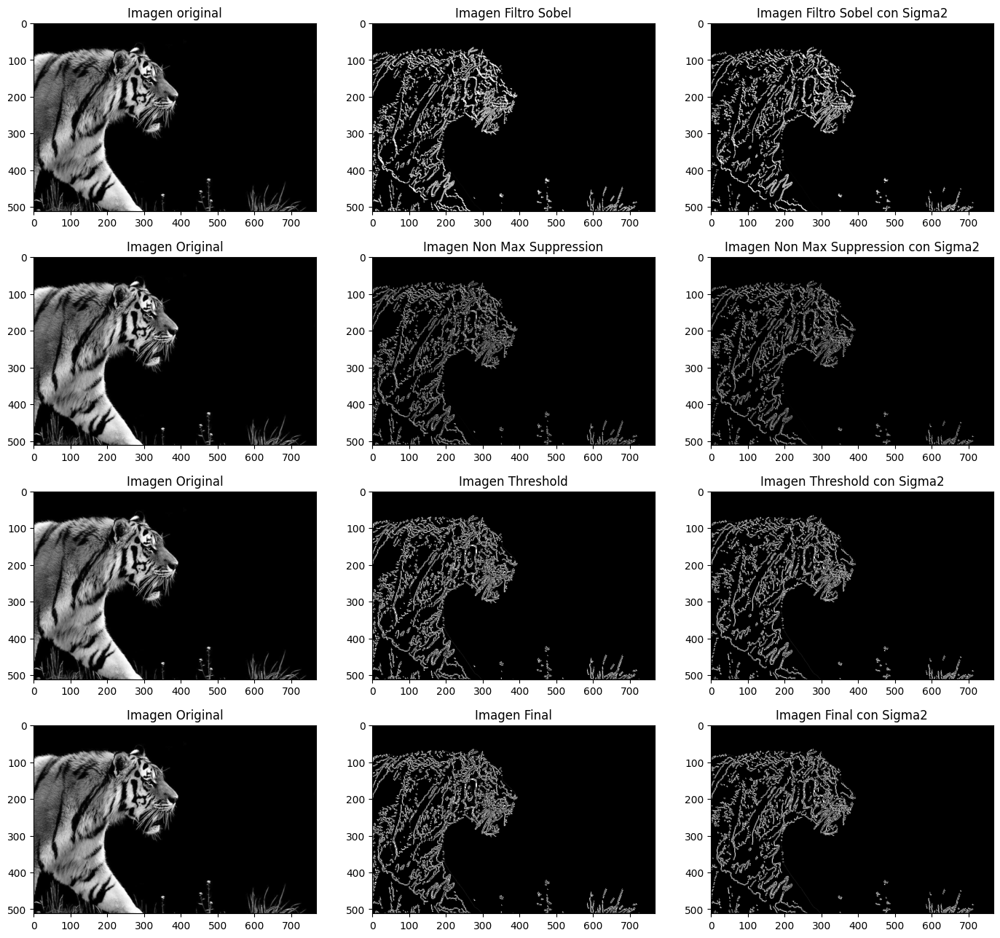

In [61]:
set_canny(img_gray, img_gaussian, img_gaussian_sigma_2)